In [1]:
import scanpy
import anndata
import matplotlib
from matplotlib import pyplot
import hdf5plugin
import numpy
import scvelo
import seaborn
import pandas
import sdevelo
import warnings
import cellrank
import moscot

(Working on SDEvelo 0.2.12)
2026-01-26 18:03:03


In [2]:
# Read input file
working_directory = "RNA Sequencing Data/"
adata = scanpy.read_h5ad(working_directory + "/velocity_sdevelo.h5ad")
print(adata)

AnnData object with n_obs × n_vars = 12791 × 2000
    obs: 'barcode', 'batch', 'sample', 'group', 'day', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'latent_time', 'sde_velocity_self_transition', 'manual_root', 'manual_end', 'sde_velocity_pseudotime'
    var: 'ensemble_ids', 'gene_symbol', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_sigma_1', 'fit_sigma_2'
    uns: 'log1p', 'neighbors', 'pca', 'sample_colors', 'sde_velocity_graph', 'sde_velocity_graph_neg', 'sde_velocity_params'
    obsm: 'X_fdl', 'X_pca', 'X_umap', 'sde_velocity_fdl'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'pred_s', 'pred_u', 'sde_velocity', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'


In [3]:
# Suppress warnings

warnings.simplefilter("ignore", category=UserWarning)

In [4]:
# Create velocity kernel

velocity_kernel = cellrank.kernels.VelocityKernel(adata, vkey="sde_velocity")
velocity_kernel.compute_transition_matrix()

  0%|          | 0/12791 [00:00<?, ?cell/s]

  0%|          | 0/12791 [00:00<?, ?cell/s]

VelocityKernel[n=12791, model='deterministic', similarity='correlation', softmax_scale=6.344]

In [5]:
# Create kernel based on latent time

latent_time_kernel = cellrank.kernels.PseudotimeKernel(adata, time_key = "latent_time")
latent_time_kernel.compute_transition_matrix()

  0%|          | 0/12791 [00:00<?, ?cell/s]

PseudotimeKernel[n=12791, dnorm=False, scheme='hard', frac_to_keep=0.3]

In [6]:
# Kernel based on gene expression similarity

# Neigborhood calculation is based on 30 pcs, 30 neighbors
print(adata.uns["neighbors"])

connectivity_kernel = cellrank.kernels.ConnectivityKernel(adata)
connectivity_kernel.compute_transition_matrix()

{'connectivities_key': 'connectivities', 'distances_key': 'distances', 'params': {'method': 'umap', 'metric': 'euclidean', 'n_neighbors': 30, 'n_pcs': 30, 'random_state': 0}}


ConnectivityKernel[n=12791, dnorm=True, key='connectivities']

In [7]:
# Combine all three kernels

combined_kernel = 0.5*velocity_kernel + 0.3*latent_time_kernel + 0.2*connectivity_kernel
combined_kernel.compute_transition_matrix()

(0.5 * VelocityKernel[n=12791, model='deterministic', similarity='correlation', softmax_scale=6.344] + 0.3 * PseudotimeKernel[n=12791, dnorm=False, scheme='hard', frac_to_keep=0.3] + 0.2 * ConnectivityKernel[n=12791, dnorm=True, key='connectivities'])

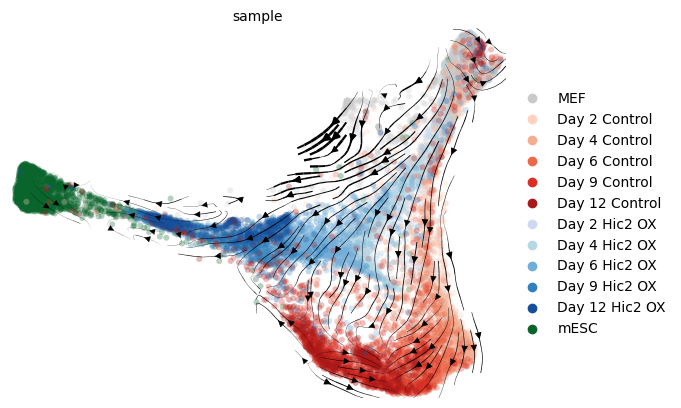

In [17]:
# Plot kernel vector field

combined_kernel.plot_projection(basis="fdl", color="sample", legend_loc="right margin")

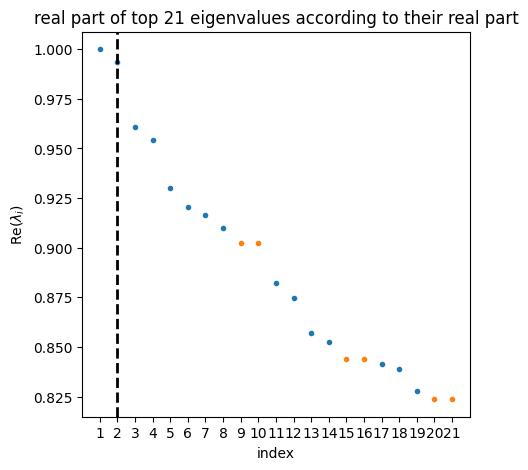

In [9]:
estimator = cellrank.estimators.GPCCA(combined_kernel)
estimator.compute_schur()
estimator.plot_spectrum(real_only=True)

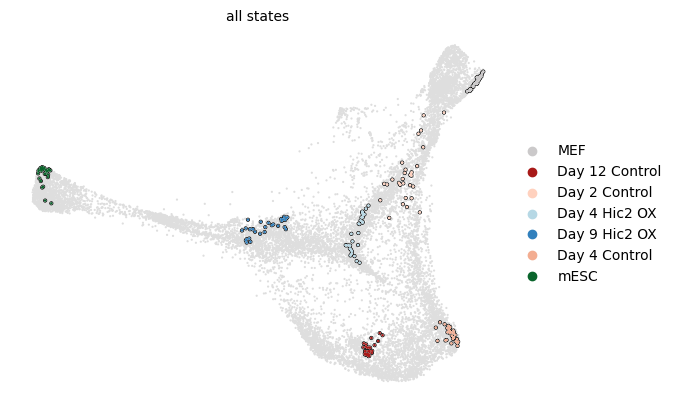

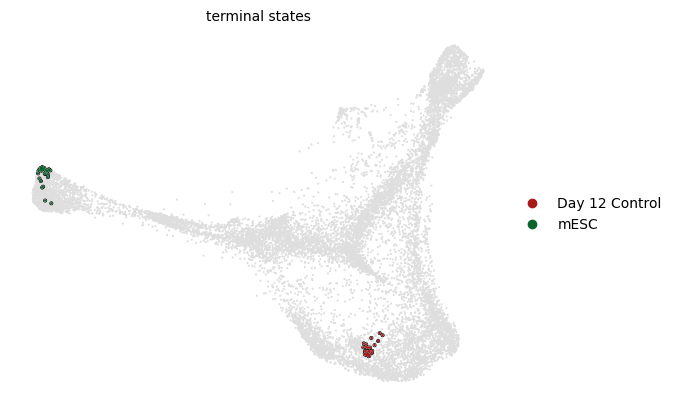

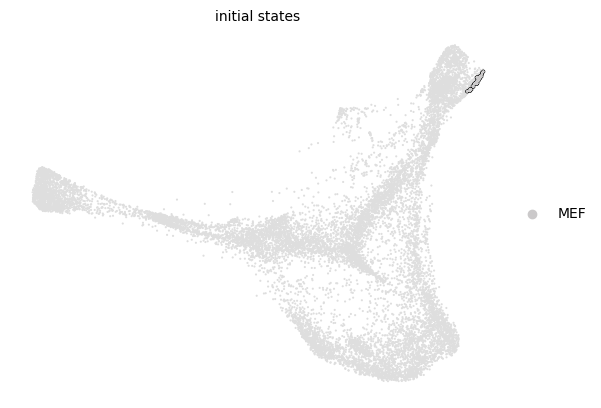

In [10]:
estimator = cellrank.estimators.GPCCA(combined_kernel)
estimator.fit(n_states=[4, 10], cluster_key="sample")

estimator.plot_macrostates(which="all", legend_loc="right", s=10, basis="fdl")
macrostates = estimator.macrostates_memberships.names

# Predict terminal states

estimator.predict_terminal_states(method="eigengap")
estimator.plot_macrostates(which="terminal", legend_loc="right", discrete=True, basis="fdl")
terminal_states = estimator.terminal_states_memberships.names

# Predict initial states

estimator.predict_initial_states()
estimator.plot_macrostates(which="initial", legend_loc="right", basis="fdl", discrete=True)
initial_states = estimator.initial_states_memberships.names

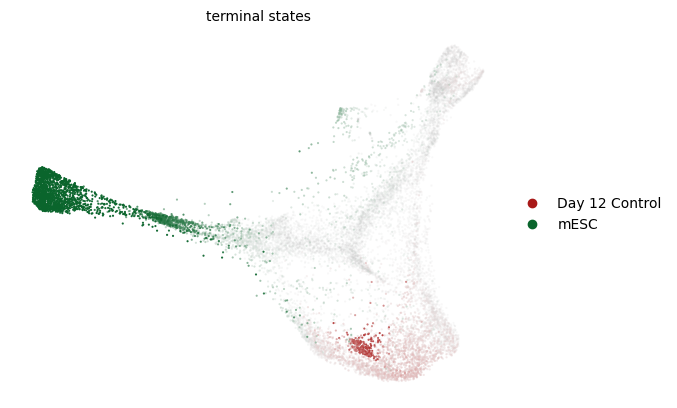

In [39]:
# Plot probability of cells belonging to the terminal states

estimator.plot_macrostates(which="terminal", legend_loc="right", discrete=False, basis="fdl")

In [ ]:
# Plot stability values. These are used to find terminal states with method="stability" and show that Day 4 control and Day 9 Hic2 OX are metastable

stability_values = estimator.coarse_T.values.diagonal()

stability_df = pandas.DataFrame({
    "Macrostate": macrostates,
    "Stability": stability_values
}).sort_values("Stability", ascending=False)

print(stability_df)

       Macrostate  Stability
6            mESC   0.995905
1  Day 12 Control   0.973201
5   Day 4 Control   0.968989
4   Day 9 Hic2 OX   0.960285
3   Day 4 Hic2 OX   0.937135
2   Day 2 Control   0.922084
0             MEF   0.918123


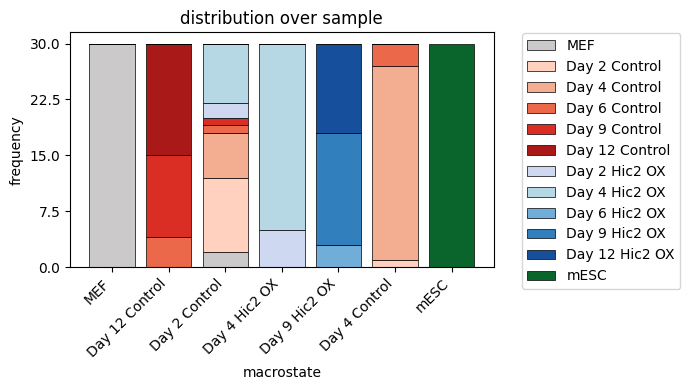

In [20]:
estimator.plot_macrostate_composition(key="sample", figsize=(7, 4))

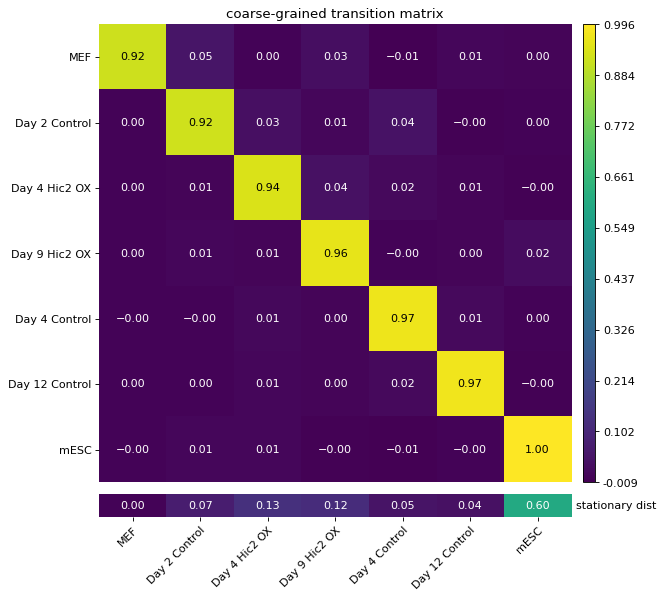

In [21]:
estimator.plot_coarse_T()

  0%|          | 0/2 [00:00<?, ?/s]

  0%|          | 0/2 [00:00<?, ?/s]

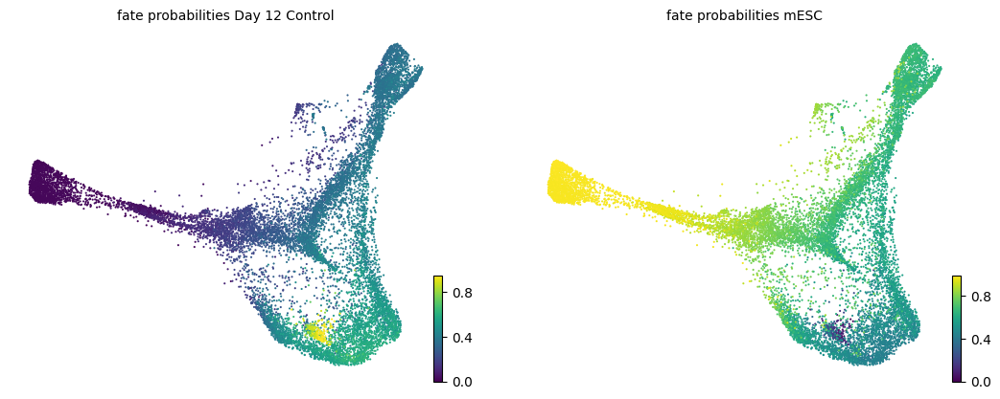

In [24]:
# Estimate fate probabilities

estimator.compute_fate_probabilities()

# Add fate probabilities to adata
for terminal_state in terminal_states:
    adata.obs[f"fate_probabilities_{terminal_state}"] = estimator.fate_probabilities[terminal_state].X.flatten()
estimator.compute_fate_probabilities()
estimator.plot_fate_probabilities(same_plot=False, basis="fdl")

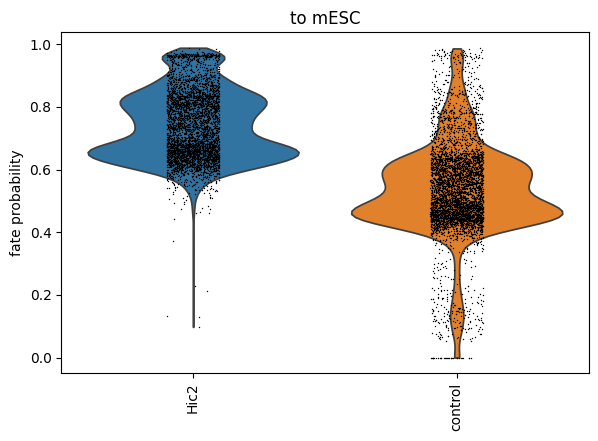

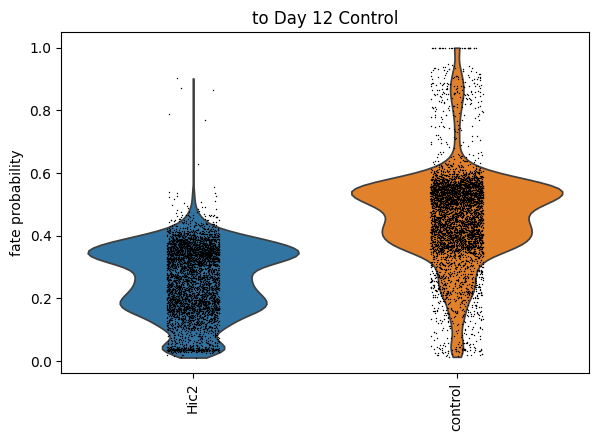

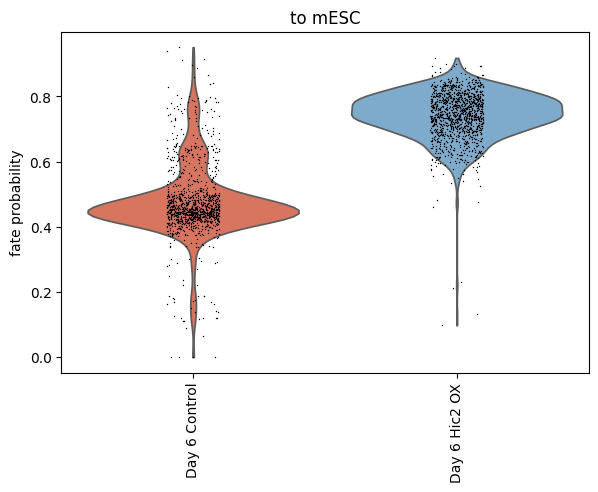

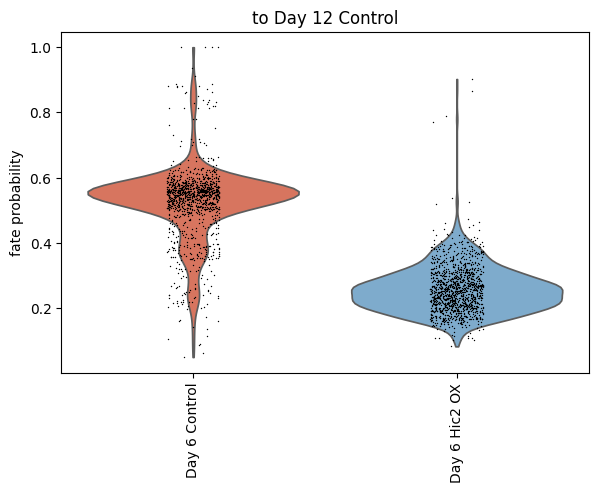

In [28]:
# Aggregate fate probabilities

cellrank.pl.aggregate_fate_probabilities(
    adata,
    mode="violin",
    lineages=["mESC"],
    cluster_key="group",
    clusters=["control", "Hic2"],
)

cellrank.pl.aggregate_fate_probabilities(
    adata,
    mode="violin",
    lineages=["Day 12 Control"],
    cluster_key="group",
    clusters=["control", "Hic2"],
)

cellrank.pl.aggregate_fate_probabilities(
    adata,
    mode="violin",
    lineages=["mESC"],
    cluster_key="sample",
    clusters=["Day 6 Control", "Day 6 Hic2 OX"],
)

cellrank.pl.aggregate_fate_probabilities(
    adata,
    mode="violin",
    lineages=["Day 12 Control"],
    cluster_key="sample",
    clusters=["Day 6 Control", "Day 6 Hic2 OX"],
)

In [29]:
# Find driver genes for all terminal states

reprogramming_groups = ["Hic2", "control"]

driver_df = estimator.compute_lineage_drivers(
    cluster_key="group", clusters=reprogramming_groups
)
corr_columns = [state+"_corr" for state in terminal_states]


In [30]:
# Drivers for mESCs
driver_df.sort_values("mESC_corr", ascending=False).head(20)[corr_columns]

,Day 12 Control_corr,mESC_corr
gene_names,,
Rbpms2,-0.595650,0.595650
Mdk,-0.589451,0.589447
Fbxo15,-0.585500,0.585502
Folr1,-0.579041,0.579041
Utf1,-0.575100,0.575101
Gdf3,-0.561746,0.561746
Apoc1,-0.559078,0.559078
Klhl13,-0.556009,0.556013
Dnmt3l,-0.554513,0.554515


In [34]:
# Drivers for Day 12 control
driver_df.sort_values("Day 12 Control_corr", ascending=False).head(20)[corr_columns]

,Day 12 Control_corr,mESC_corr
gene_names,,
Cd24a,0.661848,-0.661865
Lmo1,0.589323,-0.589323
Ctsz,0.572911,-0.572941
Crip2,0.571880,-0.571889
Rtn4r,0.571770,-0.571770
Lgals7,0.568690,-0.568687
Tmem238,0.531450,-0.531455
Pcolce2,0.523112,-0.523109
S100a16,0.519374,-0.519379


In [36]:
# How specific genes correlate with terminal states
genes_of_interest = ["Krtdap", "Krt8", "Krt14", "Nanog", "Tet1", "Cdh1", "Atf3"]
driver_df.loc[genes_of_interest, corr_columns]

,Day 12 Control_corr,mESC_corr
gene_names,,
Krtdap,0.096222,-0.096217
Krt8,0.433672,-0.433667
Krt14,0.342169,-0.342166
Nanog,-0.306781,0.306779
Tet1,-0.480363,0.480365
Cdh1,0.307155,-0.307154
Atf3,0.342218,-0.342220


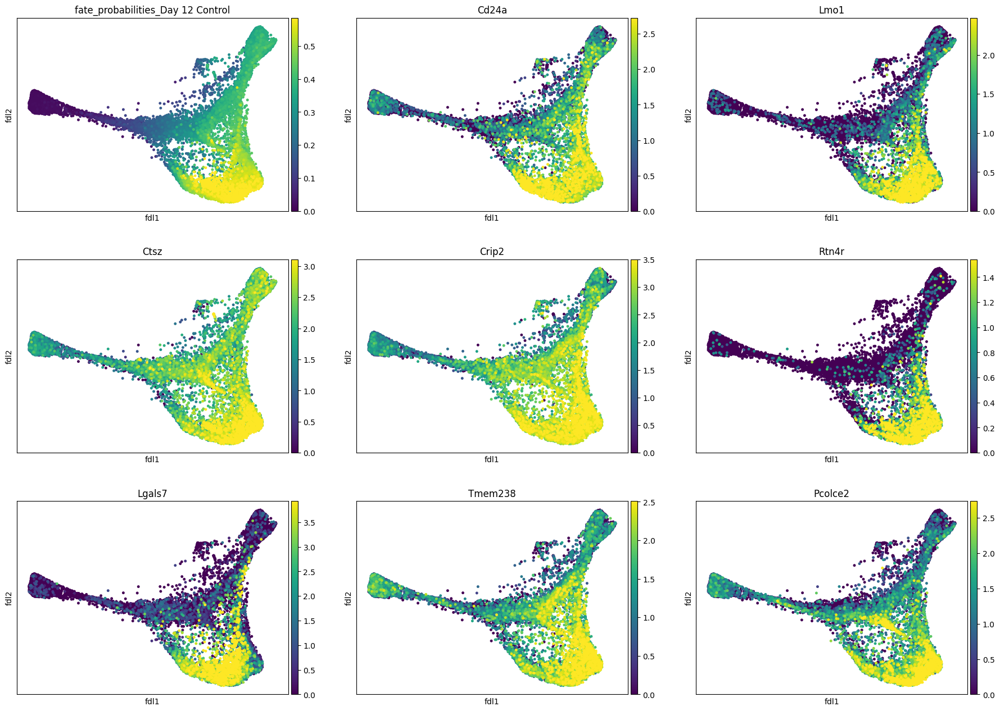

In [37]:
# Visualize driver genes for day 12 control

terminal_state = "Day 12 Control"
scanpy.pl.embedding(
    adata,
    basis="fdl",
    color=[f"fate_probabilities_{terminal_state}"] + list(driver_df.sort_values(f"{terminal_state}_corr", ascending=False).index[:8]),
    color_map="viridis",
    s=50,
    ncols=3,
    vmax="p96",
)

In [40]:
# Gene expression over time

# Create model
model = cellrank.models.GAMR(adata, n_knots=6, smoothing_penalty=10.0) # GAMR can be used instead to have the R model

To use GAM, pygam is needed

To use GAMR, r-base, rpy2 and mgcv are needed

In [29]:
print(adata.obs.columns)

Index(['barcode', 'batch', 'sample', 'group', 'day', 'n_genes_by_counts',
       'total_counts', 'total_counts_mt', 'pct_counts_mt',
       'initial_size_unspliced', 'initial_size_spliced', 'initial_size',
       'n_counts', 'latent_time', 'sde_velocity_self_transition',
       'manual_root', 'manual_end', 'sde_velocity_pseudotime',
       'macrostates_fwd', 'term_states_fwd', 'term_states_fwd_probs',
       'init_states_fwd', 'init_states_fwd_probs',
       'fate_probabilities_Day 9 Control_1',
       'fate_probabilities_Day 9 Control_2', 'fate_probabilities_mESC'],
      dtype='object')


  0%|          | 0/7 [00:00<?, ?gene/s]

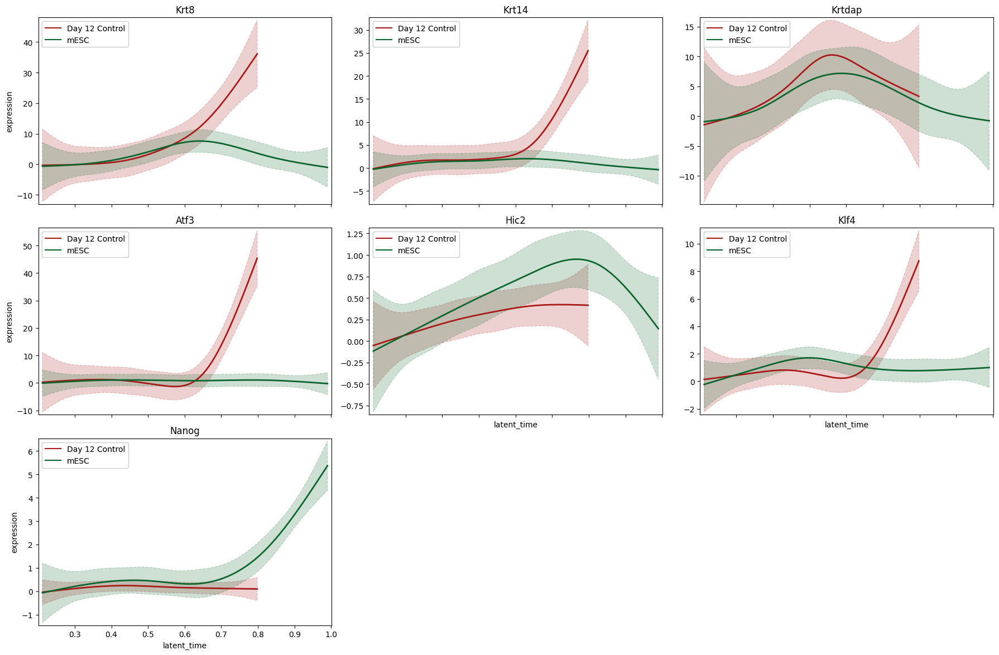

In [41]:
trend_genes = ["Krt8", "Krt14", "Krtdap", "Atf3", "Hic2", "Klf4", "Nanog"]
reprogramming_group_indices = (adata.obs["group"] == "control") | (adata.obs["group"] == "Hic2")
cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=trend_genes,
    data_key="spliced",
    same_plot=True,
    ncols=3,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/20 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


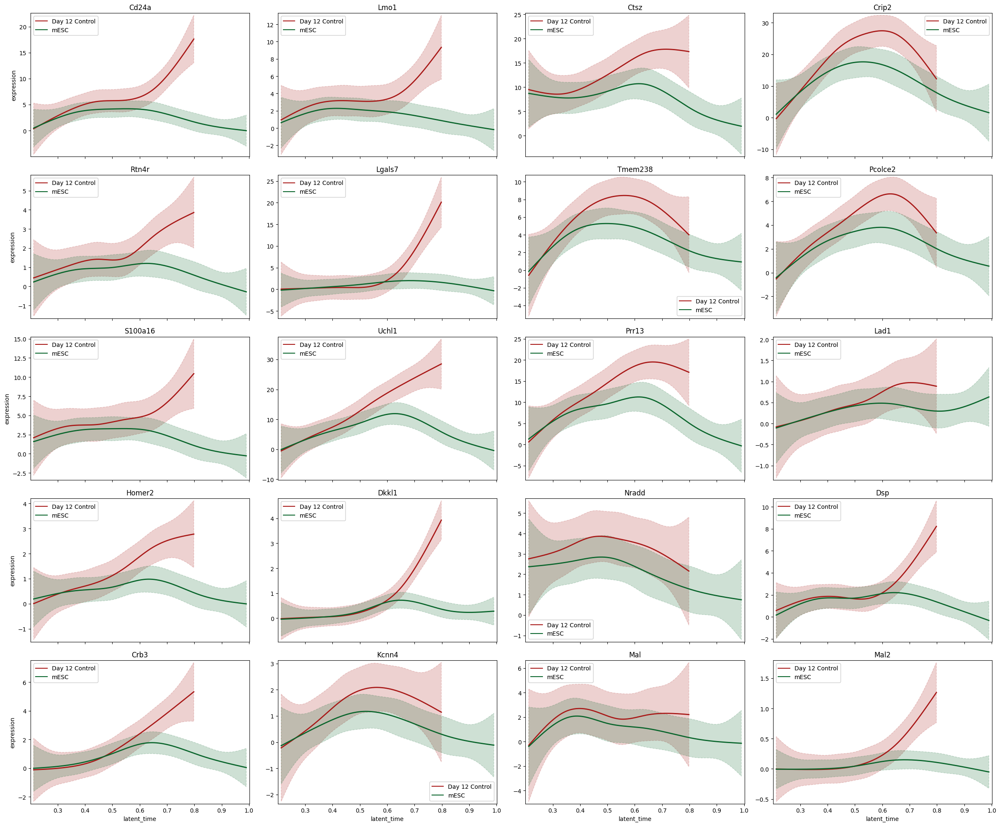

In [48]:
# The 20 strongest drivers of dead end
dead_end = "Day 12 Control"
cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(20).index,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/20 [00:00<?, ?gene/s]

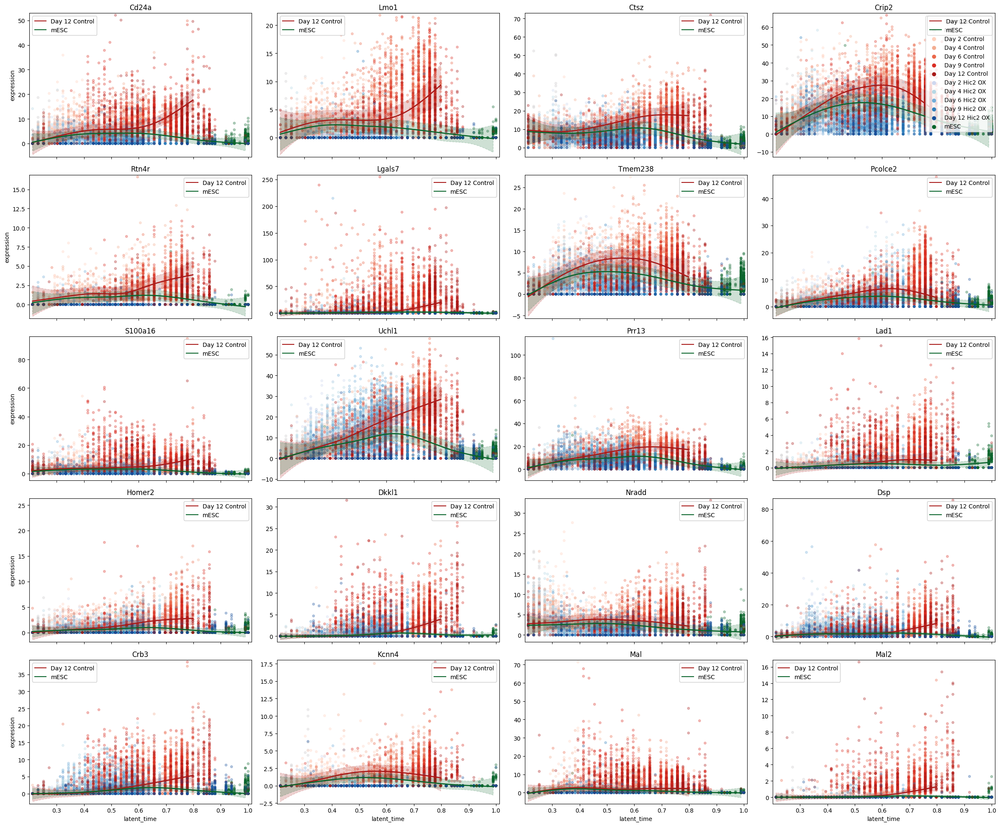

In [49]:
# Same but colored
cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(20).index,
    data_key="spliced",
    same_plot=True,
    cell_color="sample",
    cell_alpha=0.3,
    ncols=4,
    time_key="latent_time",
    hide_cells=False,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/40 [00:00<?, ?gene/s]

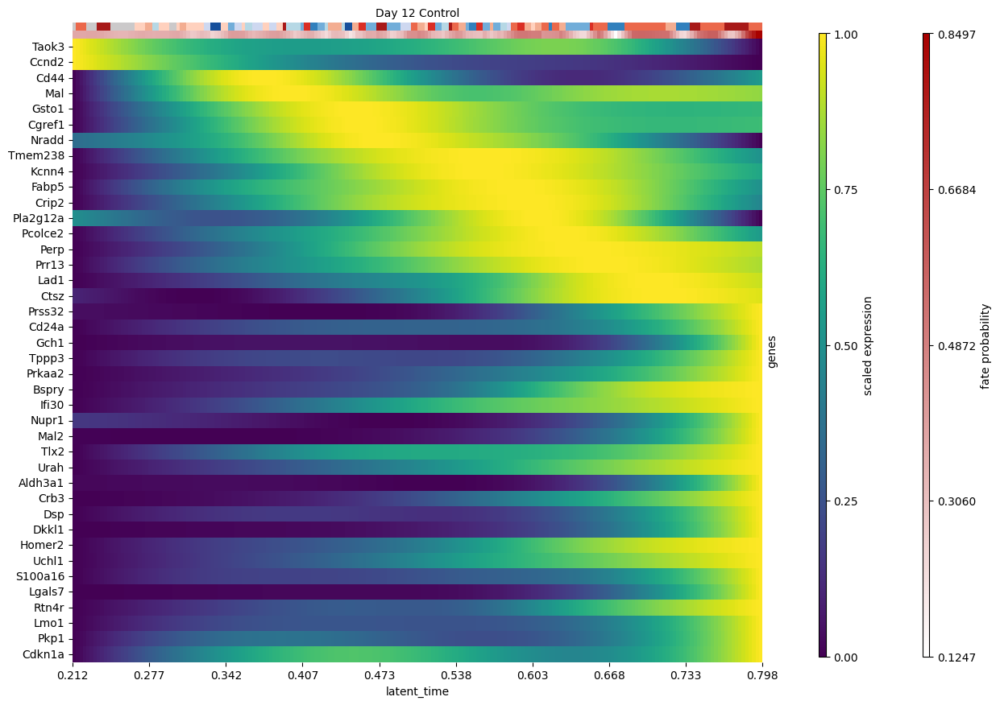

In [50]:
# Heatmap for dead-end related genes

cellrank.pl.heatmap(
    adata,
    model=model,  # use the model from before
    lineages=dead_end,
    cluster_key="sample",
    show_fate_probabilities=True,
    data_key="spliced",
    genes=driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(40).index,
    time_key="latent_time",
    figsize=(12, 10),
    show_all_genes=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/40 [00:00<?, ?gene/s]

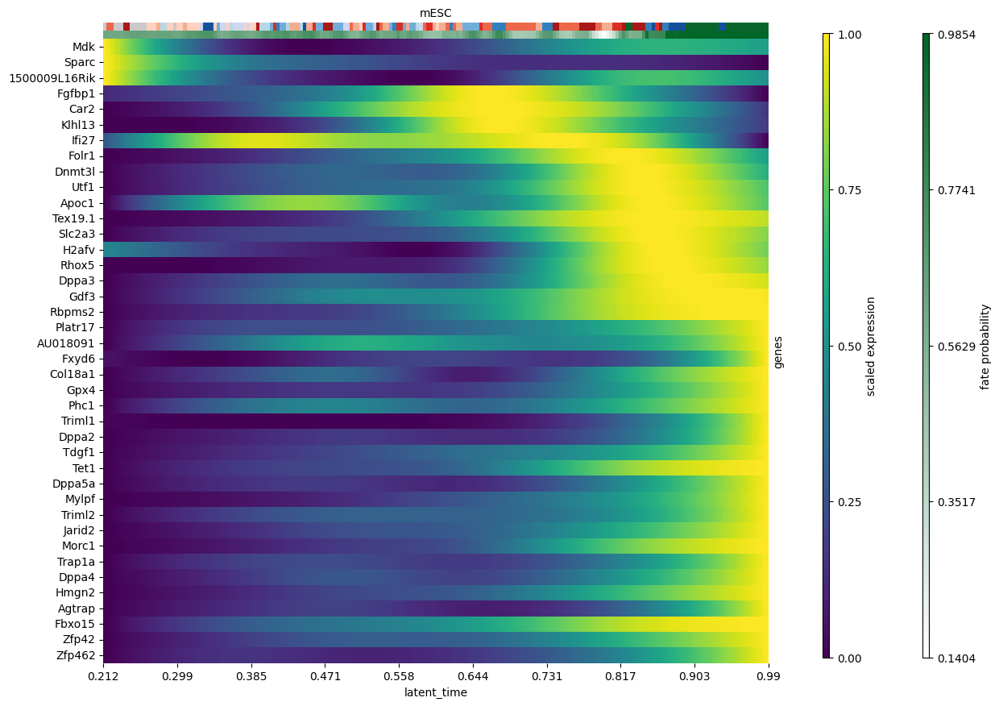

In [53]:
# Heatmap for completed reprogramming

terminal_state = "mESC"

cellrank.pl.heatmap(
    adata,
    model=model,  # use the model from before
    lineages=terminal_state,
    cluster_key="sample",
    show_fate_probabilities=True,
    data_key="spliced",
    genes=driver_df.sort_values(f"{terminal_state}_corr", ascending=False).head(40).index,
    time_key="latent_time",
    figsize=(12, 10),
    show_all_genes=True,
    weight_threshold=(1e-3, 1e-3),
)


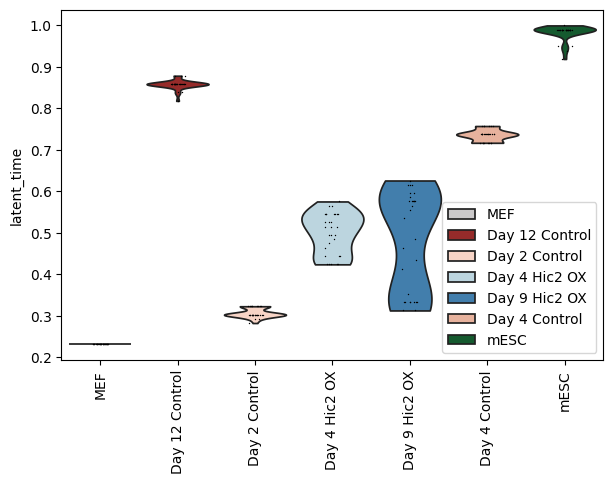

In [54]:
# Show macrostates in latent time

scanpy.pl.violin(adata, keys=["latent_time"], groupby="macrostates_fwd", rotation=90)

Clustering requires the leidenalg package

  0%|          | 0/2000 [00:00<?, ?gene/s]

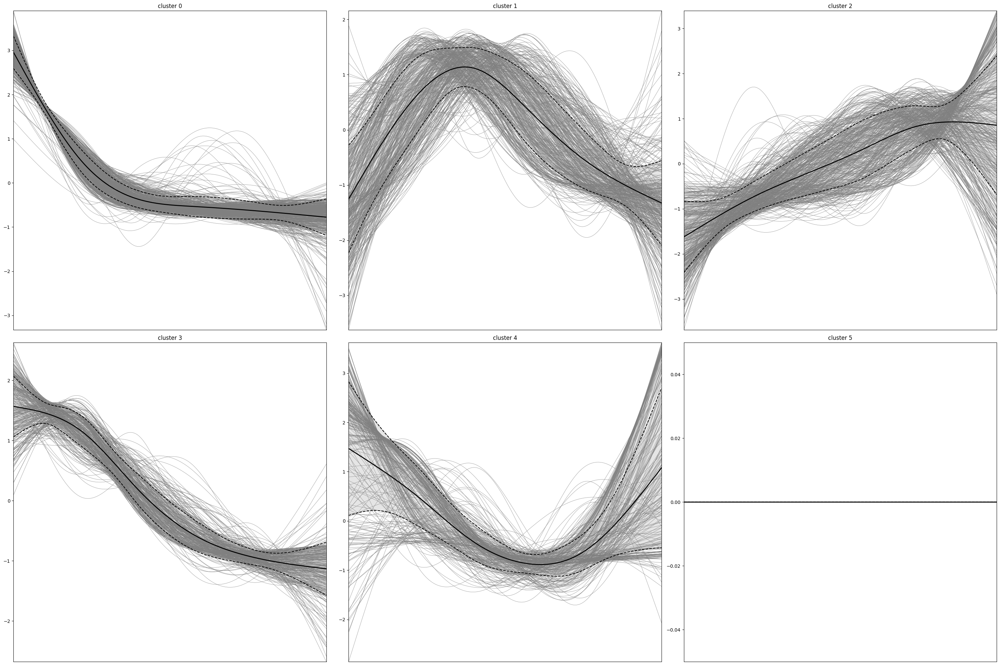

In [55]:
# Cluster for dead end

cellrank.pl.cluster_trends(
    adata,
    lineage=dead_end,
    model=model,  # use the model from before
    data_key="spliced",
    genes=adata[:, adata.var["highly_variable"]].var_names,
    time_key="latent_time",
    weight_threshold=(1e-3, 1e-3),
    n_jobs=16,
    random_state=0,
    clustering_kwargs={"resolution": 0.2, "random_state": 0},
    neighbors_kwargs={"random_state": 0},
)


  0%|          | 0/2000 [00:00<?, ?gene/s]

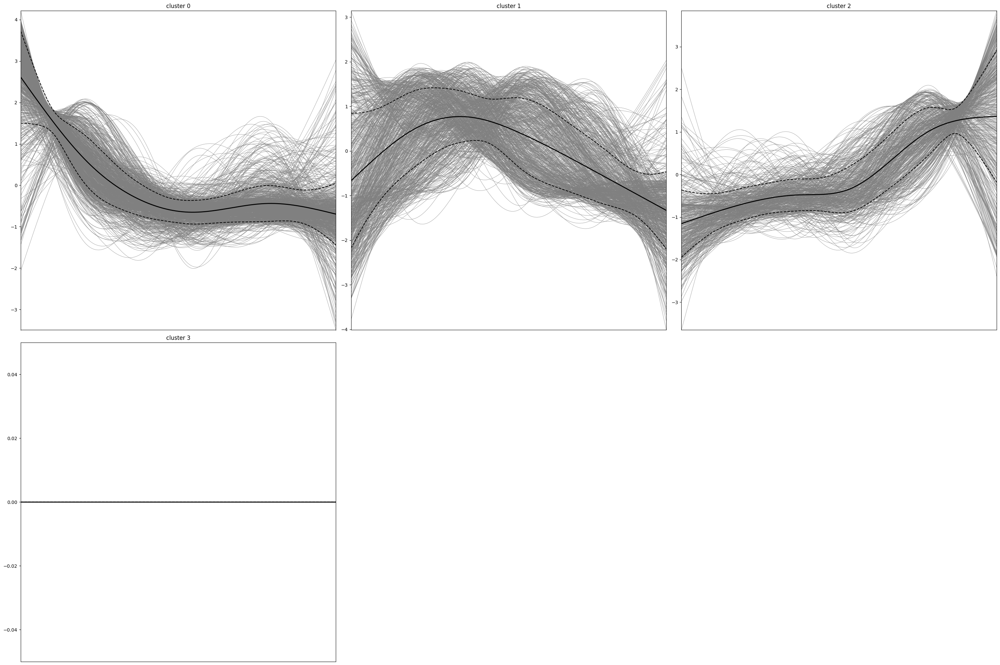

In [56]:
# Cluster for mESC

cellrank.pl.cluster_trends(
    adata,
    lineage="mESC",
    model=model,  # use the model from before
    data_key="spliced",
    genes=adata[:, adata.var["highly_variable"]].var_names,
    time_key="latent_time",
    weight_threshold=(1e-3, 1e-3),
    n_jobs=16,
    random_state=0,
    clustering_kwargs={"resolution": 0.2, "random_state": 0},
    neighbors_kwargs={"random_state": 0},
)


In [58]:
# Copy gene clusters to separate anndata objects

dead_end_adata = adata.uns[f"lineage_{dead_end}_trend"].copy()
cols = ["means", "dispersions"]
dead_end_adata.obs = dead_end_adata.obs.merge(
    right=adata.var[cols], how="left", left_index=True, right_index=True
)
mESC_adata = adata.uns["lineage_mESC_trend"].copy()
mESC_adata.obs = mESC_adata.obs.merge(
    right=adata.var[cols], how="left", left_index=True, right_index=True
)

print(dead_end_adata)

AnnData object with n_obs × n_vars = 2000 × 200
    obs: 'clusters', 'means', 'dispersions'
    var: 'x_test'
    uns: 'pca', 'neighbors', 'clusters'
    obsm: 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


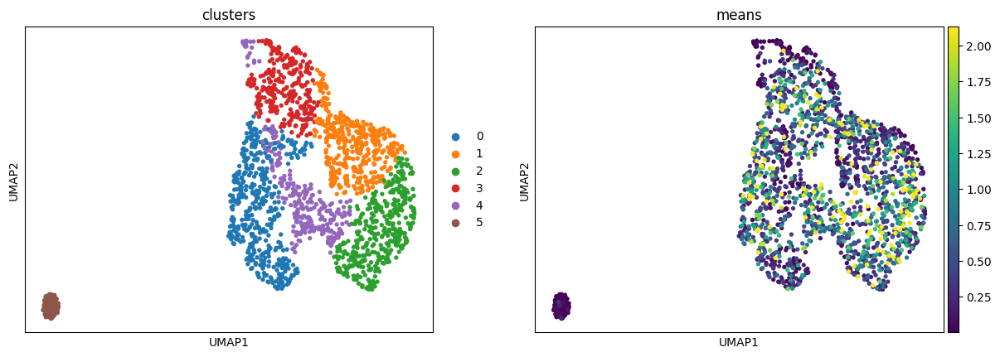

In [59]:
# Visualize gene clusters

scanpy.tl.umap(dead_end_adata, random_state=0)

scanpy.pl.embedding(dead_end_adata, basis="umap", color=["clusters", "means"], vmax="p95")


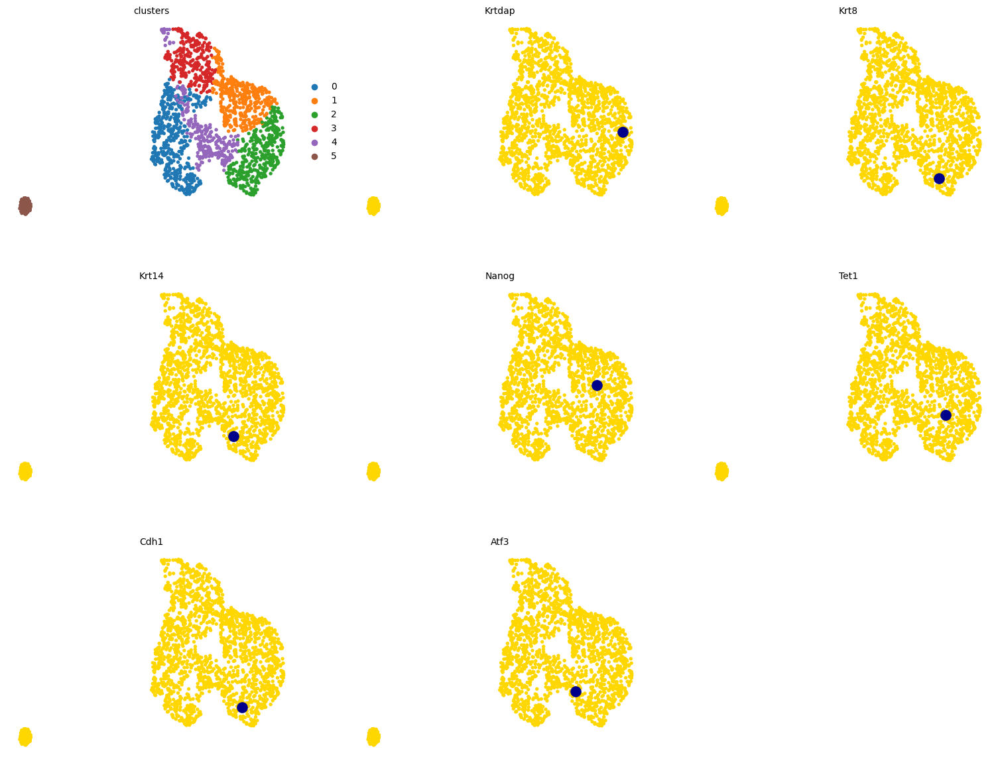

In [60]:
# Visualize where in the clusters genes of interest are found

# retrieve their indices for plotting
indices = [numpy.where(numpy.in1d(dead_end_adata.obs_names, gene))[0][0] for gene in genes_of_interest]
title = ["clusters"] + genes_of_interest

scvelo.pl.scatter(
    dead_end_adata, c=["clusters"] + indices, title=title, ncols=3, legend_loc="right"
)

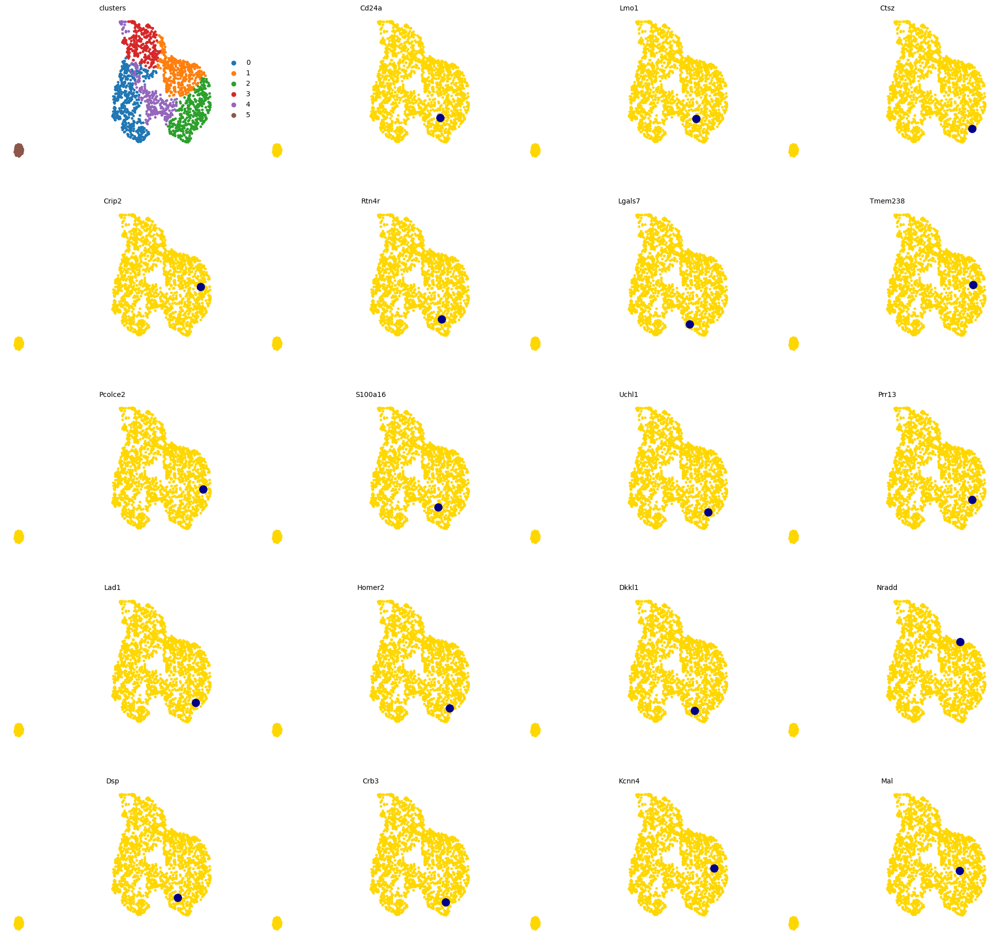

In [62]:
# Visualize where driver genes are found

# retrieve their indices for plotting
driver_genes = list(driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(19).index)
indices = [numpy.where(numpy.in1d(dead_end_adata.obs_names, gene))[0][0] for gene in driver_genes]
title = ["clusters"] + driver_genes

scvelo.pl.scatter(
    dead_end_adata, c=["clusters"] + indices, title=title, ncols=4, legend_loc="right"
)

Most genes have late peaks, but Nradd has an intermediate peak. Nradd promotes apoptosis. Genes with similar expression dynamics can be found.

  0%|          | 0/10 [00:00<?, ?gene/s]

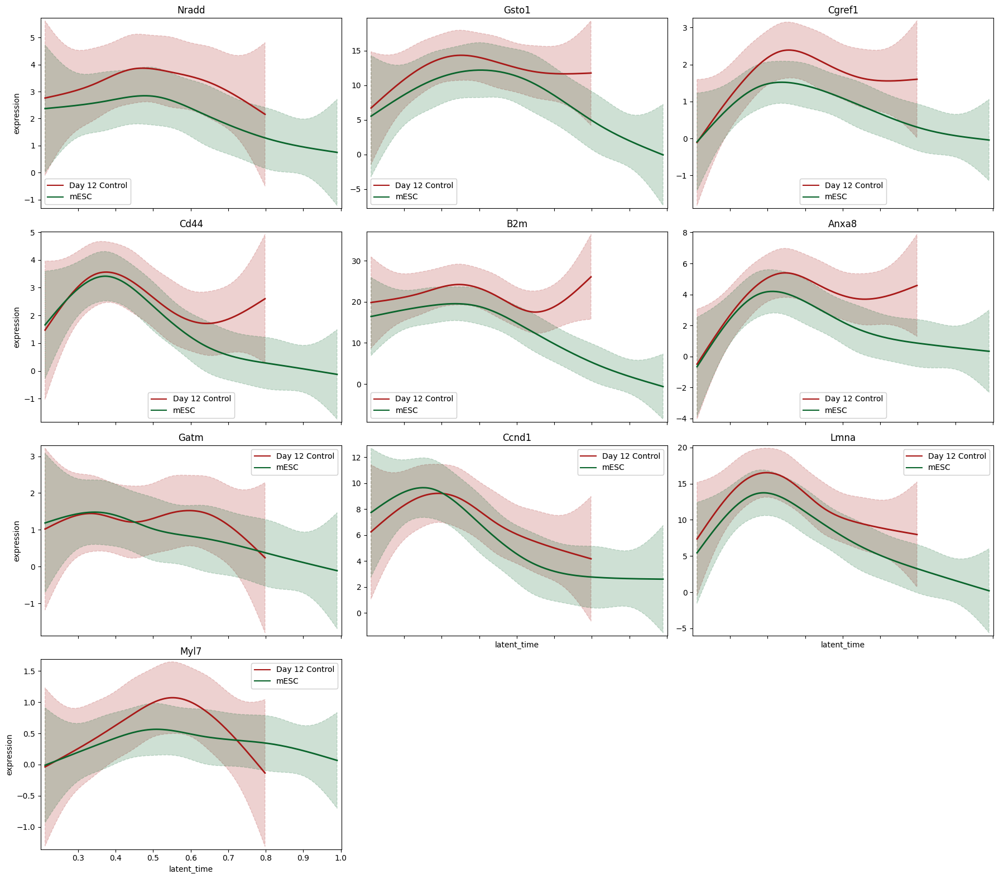

In [88]:
# Find driver genes peaking in the middle

mid_peak_genes = dead_end_adata[dead_end_adata.obs["clusters"] == "1"]
mid_peak_drivers = []

for driver_gene in driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(100).index:
    if driver_gene in mid_peak_genes.obs.index:
        mid_peak_drivers.append(driver_gene)

cellrank.pl.gene_trends(
    adata,
    model=model,
    cell_color="sample",
    data_key="spliced",
    genes=mid_peak_drivers,
    same_plot=True,
    ncols=3,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

  0%|          | 0/10 [00:00<?, ?gene/s]

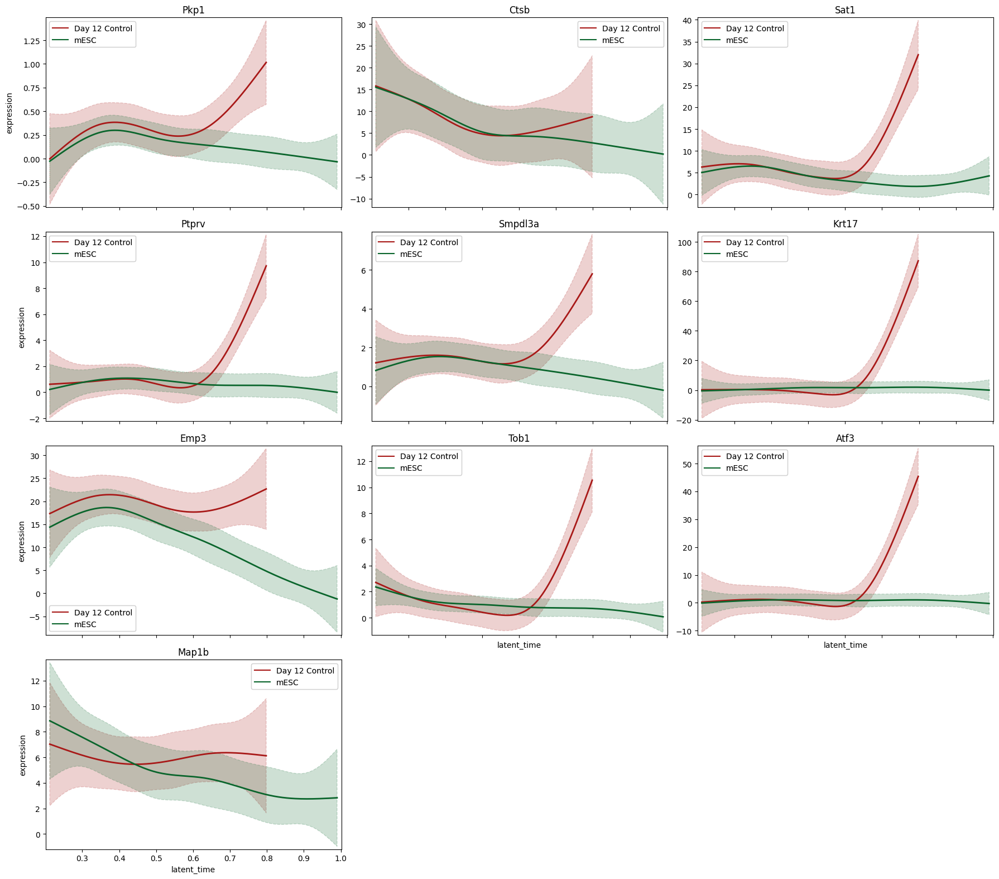

In [85]:
# Find driver genes with u-shaped expression

mid_peak_genes = dead_end_adata[dead_end_adata.obs["clusters"] == "4"]
mid_peak_drivers = []

for driver_gene in driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(100).index:
    if driver_gene in mid_peak_genes.obs.index:
        mid_peak_drivers.append(driver_gene)

cellrank.pl.gene_trends(
    adata,
    model=model,
    cell_color="sample",
    data_key="spliced",
    genes=mid_peak_drivers,
    same_plot=True,
    ncols=3,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

  0%|          | 0/1 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


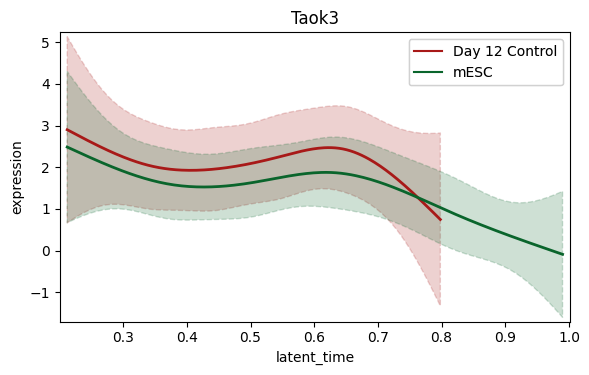

In [87]:
# Find driver genes with early dips in expression

mid_peak_genes = dead_end_adata[dead_end_adata.obs["clusters"] == "0"]
mid_peak_drivers = []

for driver_gene in driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(100).index:
    if driver_gene in mid_peak_genes.obs.index:
        mid_peak_drivers.append(driver_gene)

cellrank.pl.gene_trends(
    adata,
    model=model,
    cell_color="sample",
    data_key="spliced",
    genes=mid_peak_drivers,
    same_plot=True,
    ncols=3,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

  0%|          | 0/1 [00:00<?, ?gene/s]

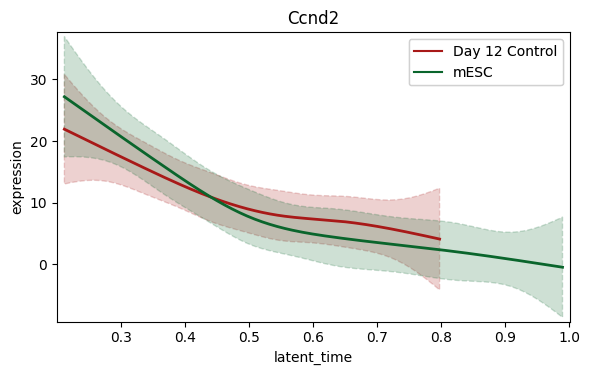

In [89]:
# Find driver genes with decrease in expression over time

mid_peak_genes = dead_end_adata[dead_end_adata.obs["clusters"] == "3"]
mid_peak_drivers = []

for driver_gene in driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(100).index:
    if driver_gene in mid_peak_genes.obs.index:
        mid_peak_drivers.append(driver_gene)

cellrank.pl.gene_trends(
    adata,
    model=model,
    cell_color="sample",
    data_key="spliced",
    genes=mid_peak_drivers,
    same_plot=True,
    ncols=3,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

In [84]:
# Save anndata objects

adata.write_h5ad(
    working_directory+"/cellrank_1.2 cells.h5ad",
    compression=hdf5plugin.FILTERS["zstd"]
)

dead_end_adata.write_h5ad(
    working_directory+"/cellrank_1.2 dead end genes.h5ad",
    compression=hdf5plugin.FILTERS["zstd"]
)

mESC_adata.write_h5ad(
    working_directory+"/cellrank_1.2 mESC genes.h5ad",
    compression=hdf5plugin.FILTERS["zstd"]
)